<h1 align="center"><b> Results </b></h1>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from config import path

In [2]:
import logging
from logs import turning_logger

turning_logger.setLevel(logging.INFO)

In [3]:
SPORTS = ("basketball", "handball", "soccer", "volleyball")

path.PLOT_PATH.mkdir(parents=True, exist_ok=True)

<h2> <b>Dataset</b> </h2>

In [4]:
from data_analysis.read_datasets import read_as_dicts

In [5]:
KEYS_TO_READ = [
    "matches",
    "stats",
    "tp",
    "permuted_tp",
    "diff_points_tp",
]

key_to_sport_to_data = read_as_dicts(SPORTS, KEYS_TO_READ)
key_to_sport_to_data["tp/0.99"] = read_as_dicts(SPORTS, "tp", 0.99)["tp"]
key_to_sport_to_data["stats/0.05"] = read_as_dicts(SPORTS, "stats", 0.05)["stats"]

In [6]:
from turning_point.match_coefficient import MatchTurningPoint

key_to_sport_to_data["mtp"] = {
    sport: MatchTurningPoint.from_matches_and_turning_point(
        key_to_sport_to_data["matches"][sport],
        key_to_sport_to_data["tp"][sport]
    )
    for sport in SPORTS
}

sport_to_num_teams = {
    sport: matches.team_names_per_id.apply(len)
    for sport, matches in key_to_sport_to_data["matches"].items()
}

In [7]:
import warnings
from turning_point.permutation_coefficient import get_turning_point_comparison

PERCENTILES = [2.5, 25, 50, 75, 97.5]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    key_to_sport_to_data["comparison_tp"] = {
        sport: get_turning_point_comparison(
            normal = key_to_sport_to_data["tp"][sport], 
            permutation_tp = key_to_sport_to_data["permuted_tp"][sport],
            percentiles = PERCENTILES,
        )
        for sport in SPORTS
    }

<h2><b> Plots </b></h2>

In [8]:
import data_analysis.plots.utils.customization
from data_analysis.plots.utils.plot_functions import flatten_axes

In [9]:
import data_analysis.plots.comparison_scatter as comp_scatter

from data_analysis.plots.variances_temporal_progression import plot_variances_temporal_progression
from data_analysis.plots.turning_point_boxplot import plot_boxplot_turning_points
from data_analysis.plots.comparison_boxplot import plot_comparison_boxplot
from data_analysis.plots.new_pontuation import plot_new_pontuation_system

<h2> Temporal Progression </h2>

<h3> Real tournament </h3>

In [10]:
TOURNEY_NAMES_AND_IDS = (
    ("NBA (Basketball: 2019/20)", "nba@/basketball/usa/nba-2019-2020/"),
    ("Superleague RU (Volleyball: 2019/20)", "superleague@/volleyball/russia/superleague-2019-2020/"),
    ("La Liga (Soccer: 2019/20)", "laliga@/soccer/spain/laliga-2019-2020/"),
    ("Bundesliga (Handball: 2019/20)", "bundesliga@/handball/germany/bundesliga-2019-2020/"),
)

TEXT_PARAMS = [
    {"text_size": 30, "tp_text_y_pos": 110, "team_text_y_pos": 75, "text_ha": "right"},
    {"text_size": 30, "tp_text_y_pos": 150, "team_text_y_pos": 125, "text_ha": "left"},
    {"text_size": 30, "tp_text_y_pos": 60, "team_text_y_pos": 50, "text_ha": "right"},
    {"text_size": 30, "tp_text_y_pos": 150, "team_text_y_pos": 115, "text_ha": "left"},
]

LAST_DATE = 60

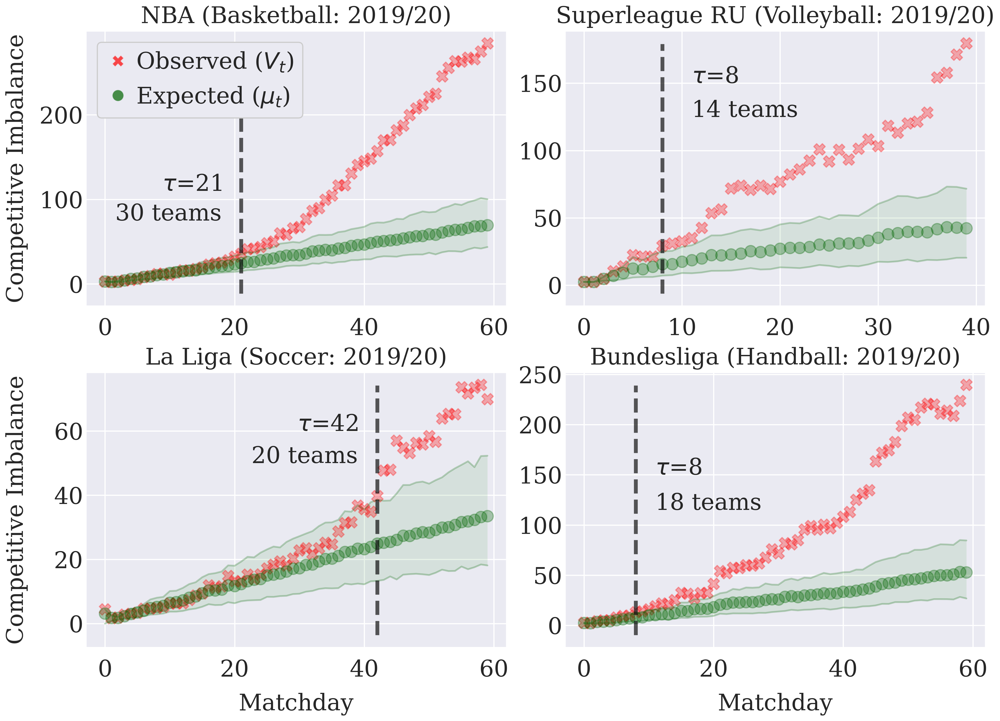

In [11]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13))

plot_variances_temporal_progression(
    fig, axs,
    key_to_sport_to_data["tp"],
    key_to_sport_to_data["stats"],
    TOURNEY_NAMES_AND_IDS,
    LAST_DATE,
    key_to_sport_to_data["stats/0.05"],
    sport_to_num_teams,
    TEXT_PARAMS,
)
for ax in flatten_axes(axs):
    ax.set_title(ax.get_title(), fontsize=30)

plt.savefig(path.PLOT_PATH / "variance_progression.pdf")

<h3> Bradley-Terry </h3>

In [12]:
STRENGTHS = {
    "1": [1] * 10,
    "0.5, 1, 2": [1/2] * 2 + [1] * 6 + [2] * 2,
    "0.25, 1, 4": [1/4] * 2 + [1] * 6 + [4] * 2,
    "0.111, 1, 9": [1/9] * 2 + [1] * 6 + [9] * 2,
}
name_to_num_teams = {name: len(strengths) for name, strengths in STRENGTHS.items()}

In [13]:
from data_analysis.numeric_analysis import filter_stats_one_simulation, run_bradley_terry_simulations

stats_lower, stats, tps = run_bradley_terry_simulations(STRENGTHS, num_simulations=1)
name_to_tp = filter_stats_one_simulation(tps, simulation_number=0)
name_to_stats = filter_stats_one_simulation(stats, simulation_number=0)
name_to_stats_lower = filter_stats_one_simulation(stats_lower, simulation_number=0)

In [14]:
TOURNEY_NAMES_AND_IDS = (
    ("[1] * 10", "bradley_terry/1"),
    ("[1/2] * 2 + [1] * 6 + [2] * 2", "bradley_terry/0.5, 1, 2"),
    ("[1/4] * 2 + [1] * 6 + [4] * 2", "bradley_terry/0.25, 1, 4"),
    ("[1/9] * 2 + [1] * 6 + [9] * 2", "bradley_terry/0.111, 1, 9"),
)

LAST_DATE = 100

Turning Point is infinity!


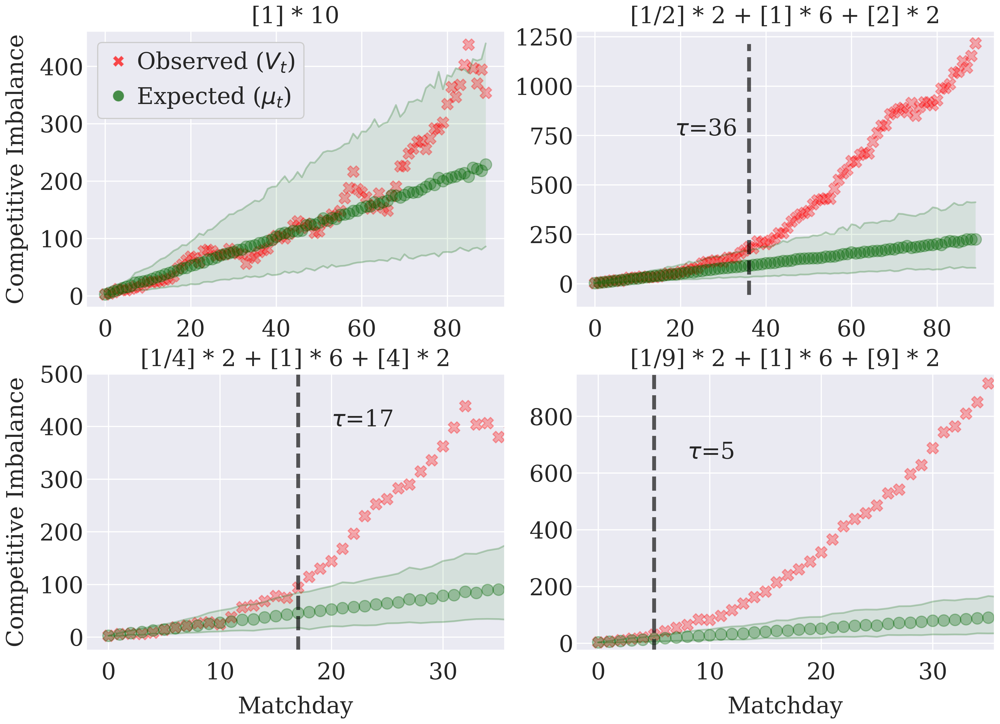

In [15]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="row")

TEXT_PARAMS = [
    {"text_size": 30, "tp_text_y_pos": 1500, "team_text_y_pos": 0, "text_ha": "right"},
    {"text_size": 30, "tp_text_y_pos": 750, "team_text_y_pos": 0, "text_ha": "right"},
    {"text_size": 30, "tp_text_y_pos": 400, "team_text_y_pos": 0, "text_ha": "left"},
    {"text_size": 30, "tp_text_y_pos": 650, "team_text_y_pos": 0, "text_ha": "left"},
]

plot_variances_temporal_progression(
    fig, axs,
    name_to_tp,
    name_to_stats,
    TOURNEY_NAMES_AND_IDS,
    LAST_DATE,
    name_to_stats_lower,
    text_params=TEXT_PARAMS.copy(),
)
for ax in flatten_axes(axs):
    ax.set_title(ax.get_title(), fontsize=30)

axs[1][0].set_xlim([-2, 35.55])
axs[1][0].set_ylim([-25, 500])
axs[1][1].set_ylim([-25, 950])

plt.savefig(path.PLOT_PATH / "variance_progression_bradley_terry.pdf")

<h2> Turning Point </h2>

<h3> Other Point System </h3>

In [16]:
other_point_system = {
    "volleyball": pd.concat(
            {
            "normal": key_to_sport_to_data["tp"]["volleyball"].df,
            "new": key_to_sport_to_data["diff_points_tp"]["volleyball"].df,
        }, axis="columns"
    )
}

In [17]:
TP_COLUMNS = {
    ("normal", "%turning point"): "3:2 - (3, 0)",
    ("new", "%turning point"): "3:2 - (2, 1)",
}

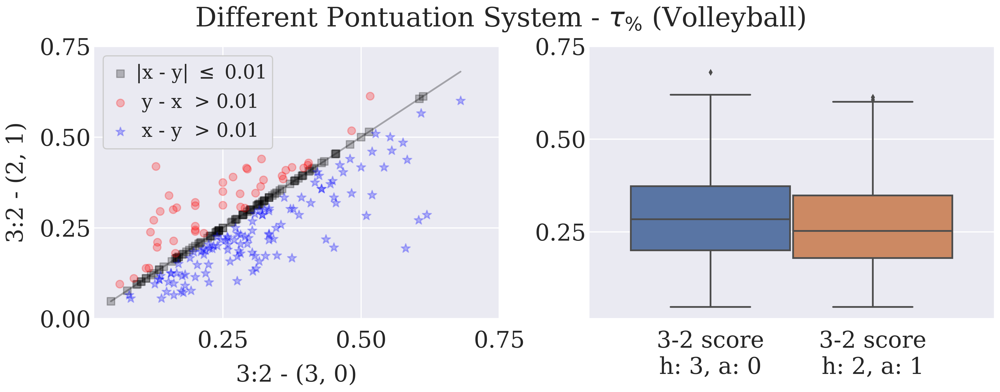

In [18]:
fig, axs = plt.subplots(1, 2, figsize=(18, 7))

plot_new_pontuation_system(fig, axs, other_point_system, tp_columns=TP_COLUMNS)
axs[0].legend(fontsize=25)
fig.suptitle(r"Different Pontuation System - $\tau_\%$ (Volleyball)", size=35)

plt.savefig(path.PLOT_PATH / "new_pontuation_system.pdf")

<h3> Other Quantile </h3>

In [19]:
other_quantile = {
    sport: pd.concat(
            { 
                "normal": key_to_sport_to_data["tp"][sport].df, 
                "new": key_to_sport_to_data["tp/0.99"][sport].df,
            }
        , axis="columns"
    )
    for sport in SPORTS
}

In [20]:
TP_COLUMNS = {
    ("normal", "%turning point"): r"0.95 quantile: $\tau_\%$",
    ("new", "%turning point"): r"0.99 quantile: $\tau_\%$",
}

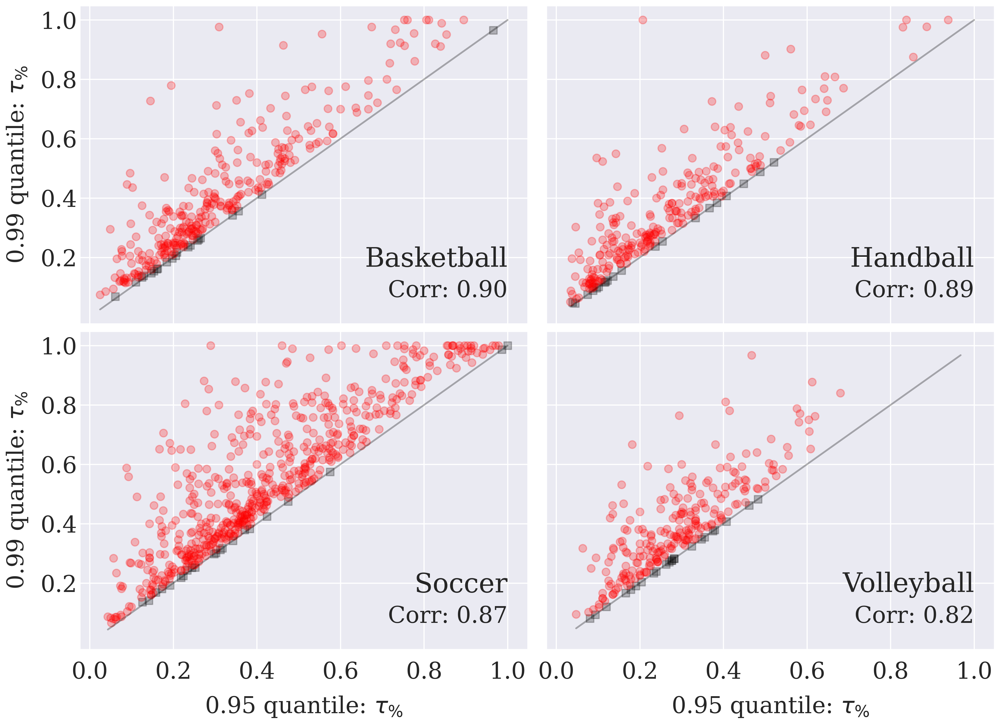

In [21]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

comp_scatter.plot_scatter_according_to_line_x_equals_y(
    fig, axs,
    other_quantile,
    TP_COLUMNS,
    x_equals_y_line=True,
    linregress=False,
    y_gt_x_percent_kwargs=None,
)

flat_axs[0].set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])

plt.savefig(path.PLOT_PATH / "turning_point_diff_quantile_comparison_scatter.pdf")

<h2>Permuted Turning Point </h2>

<h3> All tournaments </h3>

In [22]:
HUE_COLUMNS = {
    ("%turning point", "normal"): r"Observed $\tau_\%$",
    ("%turning point", "mean"): r"Expected $\hat\tau_\%$",
}

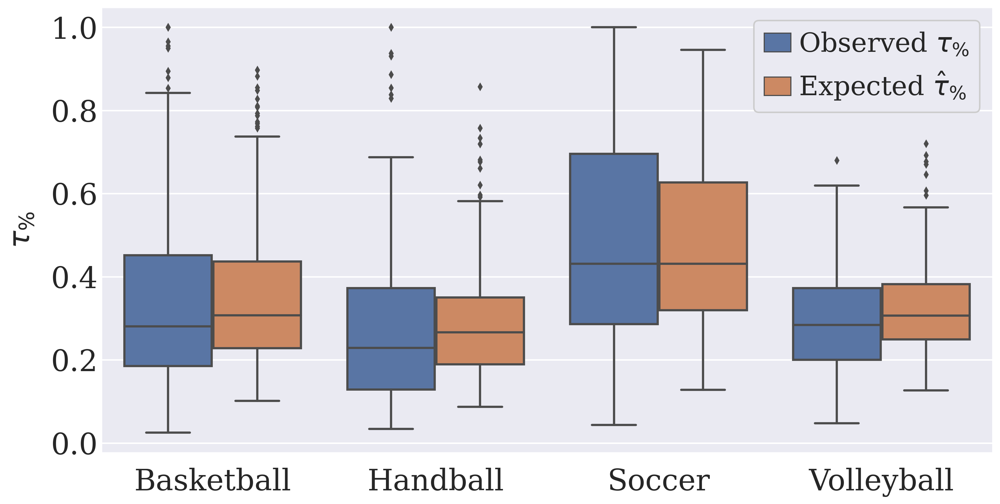

In [23]:
_, ax = plt.subplots(figsize=(14, 7))
plot_comparison_boxplot(
    ax,
    key_to_sport_to_data["comparison_tp"],
    x_column="sport",
    hue_columns=HUE_COLUMNS
)

ax.set_ylabel(r"$\tau_\%$")
ax.legend(fontsize=27)

plt.savefig(path.PLOT_PATH / "normal_permuted_comparison_boxplot.pdf")

<h3> Scatter Comparison </h3>

In [24]:
TP_COLUMNS = {
    ("%turning point", "normal"): r"Observed $\tau_\%$",
    ("%turning point", "mean"): r"Expected $\hat\tau_\%$",
}

In [25]:
outlier_example = "superliga@/volleyball/brazil/superliga-2013-2014/"
outlier_values = key_to_sport_to_data["comparison_tp"]["volleyball"].loc[outlier_example]
outlier_x = [outlier_values[list(TP_COLUMNS.keys())[0]]]
outlier_y = [outlier_values[list(TP_COLUMNS.keys())[1]]]

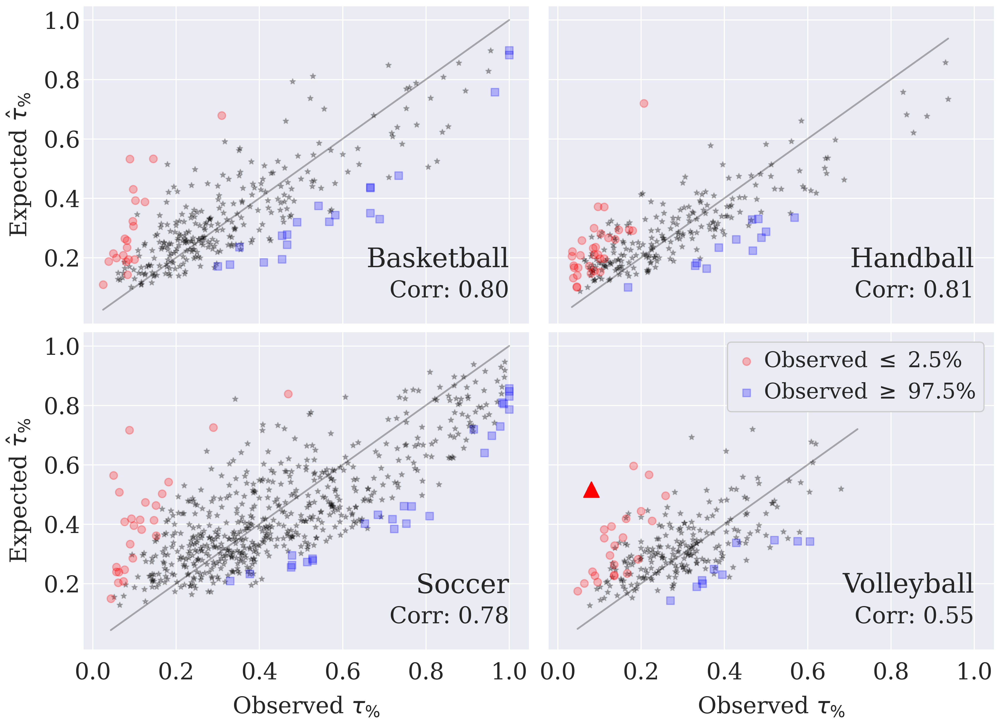

In [26]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

comp_scatter.plot_scatter_according_to_confidence_interval(
    fig, axs,
    key_to_sport_to_data["comparison_tp"],
    TP_COLUMNS,
    x_equals_y_line=True,
    y_gt_x_percent_kwargs=None,
)

flat_axs[0].set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
flat_axs[3].legend(loc="upper right", fontsize=28)

flat_axs[-1].scatter(outlier_x, outlier_y, marker="^", s=400, c="red")

plt.savefig(path.PLOT_PATH / "turning_point_permuted_comparison_scatter.pdf")

<h3> Bookmakers Predictions </h3>

In [27]:
from data_analysis.numeric_analysis import get_sport_to_bookmakers_comparison

TP_COLUMN = ("%turning point", "mean")
PLOT_COLUMNS = {
    TP_COLUMN: r"Expected $\hat\tau_\%$", 
    "%bookmarker": "Accuracy of Betting Markets"
}

sport_to_bookmakers = get_sport_to_bookmakers_comparison(
    key_to_sport_to_data["matches"],
    key_to_sport_to_data["comparison_tp"],
    TP_COLUMN,
    min_present=0.85,
)

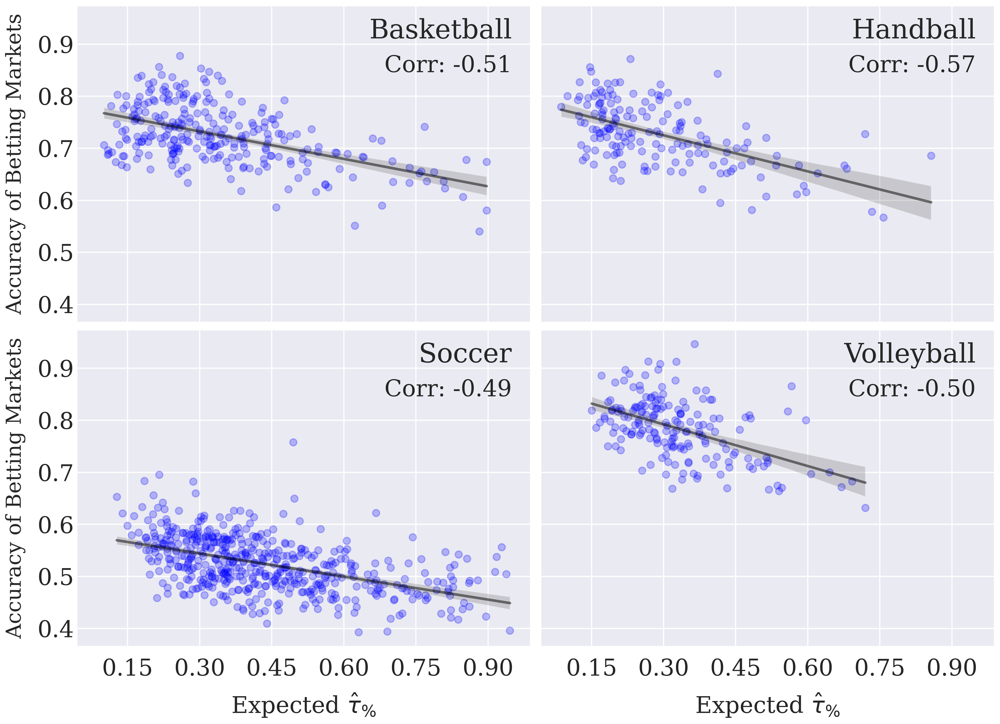

In [28]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")

comp_scatter.plot_scatter_according_to_binned_intervals(
    fig, axs,
    sport_to_bookmakers,
    PLOT_COLUMNS,
    linregress=True,
    x_equals_y_line=False,
    title_as_text_kwargs={"y": 0.95, "x": 0.95, "va": "top"},
    y_gt_x_percent_kwargs=None,
    pearson_corr_kwargs={"y": 0.88, "x": 0.95, "va": "top"},
)

first_ax = axs[0][0]
first_ax.set_yticks([0.40, 0.50, 0.60, 0.70, 0.80, 0.90])
first_ax.set_xticks([0.15, 0.30, 0.45, 0.60, 0.75, 0.90])
axs[0][0].set_ylabel("Accuracy of Betting Markets", size=27)
axs[1][0].set_ylabel("Accuracy of Betting Markets", size=27)

plt.savefig(path.PLOT_PATH / "bookmakers_predictions_comparison.pdf")

<h2><b> Numerical Analysis </b></h2>

In [29]:
{
    sport: matches.df.index.get_level_values("id").unique().size
    for sport, matches in key_to_sport_to_data["matches"].items()
}

{'basketball': 322, 'handball': 263, 'soccer': 698, 'volleyball': 256}

In [30]:
{
    sport: len(matches.df)
    for sport, matches in key_to_sport_to_data["matches"].items()
}

{'basketball': 72880, 'handball': 37956, 'soccer': 173196, 'volleyball': 27682}

<h3> Statistical data </h3>

All tournaments

In [31]:
from data_analysis.numeric_analysis import get_statistical_information

COLUMNS = ["turning point", "%turning point", "match turning point", "%match turning point"]
get_statistical_information(
    {
        sport: pd.concat(
            [key_to_sport_to_data["tp"][sport].df, key_to_sport_to_data["mtp"][sport].df],
            axis="columns"
        )
        for sport in SPORTS
    }, COLUMNS
)

basketball    handball      soccer  volleyball
tp_type              tp_data                                                
turning point        count    315.000000  263.000000  640.000000  254.000000
                     mean      22.419048   13.752852   35.793750   10.555118
                     std       16.980195   10.195968   22.701188    6.039635
                     min        2.000000    1.000000    2.000000    1.000000
                     25%       10.500000    7.000000   19.000000    6.000000
                     50%       18.000000   11.000000   30.000000    9.500000
                     75%       29.500000   18.000000   47.000000   13.000000
                     max      107.000000   70.000000  123.000000   29.000000
%turning point       count    315.000000  263.000000  640.000000  254.000000
                     mean       0.329777    0.274788    0.457044    0.292359
                     std        0.206789    0.189295    0.239375    0.126226
                     min        0.024845    0.033898    0.043478    0.047619
                     25%        0.184826    0.128571    0.277676    0.200000
                     50%        0.275862    0.228916    0.406785    0.282051
                     75%        0.430502    0.372715    0.594301    0.369481
                     max        1.000000    1.000000    1.000000    0.680000
match turning point  count    315.000000  263.000000  640.000000  254.000000
                     mean      58.231746   32.365019  108.690625   26.755906
                     std       40.986485   20.479273   78.403941   14.388575
                     min        5.000000    3.000000    5.000000    4.000000
                     25%       29.000000   18.000000   54.000000   17.000000
                     50%       48.000000   27.000000   87.000000   24.000000
                     75%       74.000000   41.000000  145.000000   33.000000
                     max      232.000000  118.000000  540.000000   92.000000
%match turning point count    315.000000  263.000000  640.000000  254.000000
                     mean       0.307203    0.253811    0.434525    0.259985
                     std        0.201612    0.176337    0.232969    0.122545
                     min        0.016260    0.016484    0.027778    0.028571
                     25%        0.171123    0.116952    0.258101    0.168182
                     50%        0.250000    0.219697    0.385118    0.251374
                     75%        0.402433    0.334077    0.572321    0.332677
                     max        0.991071    0.988889    0.988889    0.655556

New Pontuation System

In [32]:
to_multiply = [["normal", "new"], ["turning point", "%turning point"]]
NEW_POINTS_COLUMNS = pd.MultiIndex.from_product(to_multiply)

In [33]:
get_statistical_information(other_point_system, NEW_POINTS_COLUMNS).unstack(["tp_type", "tp_data"])

volleyball                                            
tp_type        normal                          new               
tp_data turning point %turning point turning point %turning point
count      254.000000     254.000000    255.000000     255.000000
mean        10.555118       0.292359      9.674510       0.268528
std          6.039635       0.126226      5.703979       0.120513
min          1.000000       0.047619      1.000000       0.047619
25%          6.000000       0.200000      5.000000       0.179029
50%          9.500000       0.282051      9.000000       0.250000
75%         13.000000       0.369481     12.000000       0.346197
max         29.000000       0.680000     29.000000       0.612903

<h3> No Turning Points </h3>

In [34]:
from data_analysis.numeric_analysis import get_no_tp

DESIRED_COLUMNS = [("%turning point", "normal")]

all_sports_df = pd.concat(key_to_sport_to_data["comparison_tp"]).reset_index(0, drop=True)
sport_to_comparison = key_to_sport_to_data["comparison_tp"] | {"total": all_sports_df}

no_tp = get_no_tp(sport_to_comparison, DESIRED_COLUMNS)
no_tp.groupby("sport").size()

sport
basketball     7
soccer        58
total         67
volleyball     2
dtype: int64

In [35]:
total_seasons = sum(
    key_to_sport_to_data["tp"][sport].df.index.unique().size
    for sport in SPORTS
)

no_tp.index.get_level_values("id").unique().size / total_seasons

0.043534762833008445

<h3> Number Low Turning Points </h3>

In [36]:
sum(
    (df[("%turning point", "mean")] < 0.10).sum()
    for _, df in key_to_sport_to_data["comparison_tp"].items()
)

1

In [37]:
sum(
    (df[("%turning point", "normal")] < 0.10).sum()
    for _, df in key_to_sport_to_data["comparison_tp"].items()
)

94

<h3> Proportion Always Inside Envelopes </h3>

In [38]:
always_inside_envelope_count = []
seasons_count = []

for sport, var_stats in key_to_sport_to_data["stats"].items():
    inside_envelope = (var_stats.df["real"] <= var_stats.df["quantile"])
    always_inside_envelope_count.append(inside_envelope.groupby("id", observed=True).all().sum() )
    seasons_count.append(var_stats.df.index.get_level_values("id").unique().size)

for sport, num_inside, total in zip(SPORTS, always_inside_envelope_count, seasons_count):
    print(sport, num_inside / total)

print(f"total {sum(always_inside_envelope_count)/sum(seasons_count)}")

basketball 0.009316770186335404
handball 0.0
soccer 0.027220630372492838
volleyball 0.0
total 0.014294996751137101


<h3> Proportion with odds </h3>

In [39]:
def get_unique_seasons(df: pd.DataFrame) -> list[str]:
    return df.index.get_level_values("id").unique().to_list()

seasons_count = []
all_odds_count = []

for sport in SPORTS:
    all_odds_count.append(len(get_unique_seasons(sport_to_bookmakers[sport])))
    seasons_count.append(len(get_unique_seasons(key_to_sport_to_data["matches"][sport].df)))
    
for sport, all_odds, seasons in zip(SPORTS, all_odds_count, seasons_count):
    print(sport, all_odds/seasons)

print(f"total {sum(all_odds_count)/sum(seasons_count)}")

basketball 0.860248447204969
handball 0.6273764258555133
soccer 0.8051575931232091
volleyball 0.71875
total 0.7719298245614035


<h3> Least Competitive </h3>

In [40]:
from data_analysis.numeric_analysis import get_mean_per_tournament
sport_order = ["soccer", "basketball", "volleyball", "handball"]

COLUMNS = [
    ("%turning point", "normal"),
    ("%turning point", "mean"),
]

mean_per_tournament = get_mean_per_tournament(
    key_to_sport_to_data["comparison_tp"],
    COLUMNS,
)

mean_per_tournament.groupby("sport", as_index=False).nth(list(range(3))).loc[sport_order]

%turning point          
                                                 normal      mean
sport      name                 country                          
soccer     serie-a              italy          0.239803  0.232898
           premier-league       england        0.235086  0.237313
           laliga               spain          0.347745  0.247830
basketball nba                  usa            0.118441  0.130889
           b-league             japan          0.116743  0.170449
           bbl                  germany        0.235831  0.211625
volleyball superleague          ukraine        0.171699  0.209295
           division-a           belarus        0.236978  0.225823
           extraliga            hungary        0.245484  0.238119
handball   andebol-1            portugal       0.142009  0.155649
           bundesliga           germany        0.137744  0.160792
           liga-nationala-women romania        0.122185  0.192562

In [41]:
soccer = mean_per_tournament.loc["soccer"].reset_index()
soccer[soccer["country"].isin({"brazil", "france", "germany"})]

name  country %turning point          
                                  normal      mean
12    bundesliga  germany       0.311907  0.329170
15       ligue-1   france       0.371053  0.348205
44       serie-a   brazil       0.507180  0.488277
52  2-bundesliga  germany       0.537065  0.521698
55       serie-b   brazil       0.628847  0.541795

<h3> Other Metrics </h3>

Correlation to other metrics

In [42]:
import turning_point.metrics as met

METRICS = {
    "nhhi": met.nhhi,
    "hicb": met.hicb,
    "gini": met.gini,
    "iqr": met.iqr,
    "cr": met.cr
}

In [43]:
from data_analysis.numeric_analysis import apply_metrics_to_final_standings

metric_final_standings = {
    sport: apply_metrics_to_final_standings(matches, METRICS)
    for sport, matches in key_to_sport_to_data["matches"].items()
}

In [44]:
final_standings_corr = {
    sport: pd.concat(
        [metric_final_standings[sport]] + [key_to_sport_to_data["comparison_tp"][sport][("%turning point", "mean")]],
        axis="columns"
    ).corr()
    for sport in SPORTS
}
final_standings_corr = pd.concat(final_standings_corr, axis="columns")
final_standings_corr.loc(axis="columns")[:, ("%turning point", "mean")].transpose()

,,nhhi,hicb,gini,iqr,cr,"(%turning point, mean)"
basketball,"(%turning point, mean)",-0.196804,-0.373285,-0.461759,-0.631781,-0.246545,1.0
handball,"(%turning point, mean)",-0.141016,-0.510833,-0.540982,-0.581282,-0.496876,1.0
soccer,"(%turning point, mean)",-0.361680,-0.588097,-0.617943,-0.597237,-0.446451,1.0
volleyball,"(%turning point, mean)",-0.179262,-0.494781,-0.535481,-0.589167,-0.050325,1.0


Invariance to dispersion metric

In [45]:
metrics = ["variance"] + list(METRICS.keys())

key_to_sport_to_metric_data = {}

for metric in metrics:
    dataset_key = "tp"
    key = f"{dataset_key}_{metric}"
    key_to_sport_to_metric_data[key] = read_as_dicts(SPORTS, "tp", metric=metric)[dataset_key]

In [46]:
def _read_metrics(key_to_sport_to_data, sport: str, metrics: list[str]) -> pd.DataFrame:
    concated_metrics =  pd.concat(
        {key: key_to_sport_to_data[f"tp_{key}"][sport].df for key in metrics},
        axis="columns"
    )
    return concated_metrics.swaplevel(0, 1, "columns").sort_index(axis="columns")

framework = {
    sport: (
        _read_metrics(key_to_sport_to_metric_data, sport, metrics)["%turning point"]
        .corr()["variance"]
    )
    for sport in SPORTS
}
framework = pd.concat(framework, axis="columns")
framework.transpose()[metrics]

,variance,nhhi,hicb,gini,iqr,cr
basketball,1.0,0.997518,0.996592,0.958755,0.587401,0.672689
handball,1.0,0.991795,0.991772,0.980687,0.542281,0.737550
soccer,1.0,0.983876,0.983876,0.950814,0.482847,0.806736
volleyball,1.0,0.997637,0.988052,0.955896,0.445925,0.519283


<h3>Temporal Progression </h3>

In [47]:
from data_analysis.numeric_analysis import get_temporal_slope_tendency, style_temporal_tendency

COLUMN = ("%turning point", "mean")

pd.set_option("display.max_rows", 150)

sport_to_comparion = {sport: key_to_sport_to_data["comparison_tp"][sport] for sport in SPORTS}
sport_to_tendency = get_temporal_slope_tendency(sport_to_comparion, COLUMN)

Average increase

In [48]:
sport_to_tendency_dict = {
    sport: sport_to_tendency[sport_to_tendency["#seasons"] > 8].loc[sport].mean()
    for sport in SPORTS
}
sport_to_tendency_dict

{'basketball': linregress slope     0.000088
 theil slope          0.001192
 #seasons            10.809524
 dtype: float64,
 'handball': linregress slope     0.002764
 theil slope          0.003191
 #seasons            10.352941
 dtype: float64,
 'soccer': linregress slope    -0.002444
 theil slope         -0.003846
 #seasons            10.595238
 dtype: float64,
 'volleyball': linregress slope     0.003481
 theil slope          0.004362
 #seasons            10.625000
 dtype: float64}

Increases per league

In [49]:
IMPORTANT_LEAGUES = [
    ("handball", "germany"),
    ("handball", "romania"),
    ("basketball", "nba"),
    ("premier-league", "soccer", "england"),
    ("soccer", "spain"),
    ("serie-a", "soccer", "italy"),
    ("soccer", "france"),
    ("bundesliga", "soccer", "germany"),
    ("serie-a", "soccer", "brazil"),
    ("volleyball", "russia"),
    ("volleyball", "italy"),
]
style_temporal_tendency(sport_to_tendency, IMPORTANT_LEAGUES)